# Model load

In [1]:
import google.colab.drive as drive

drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import random
import torch
import torchvision
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from torch.utils.data import DataLoader
from matplotlib.patches import Ellipse
from sklearn.datasets import make_blobs
from sklearn.mixture import GaussianMixture
from torchvision.transforms import transforms
from scipy.spatial.distance import mahalanobis
from sklearn.preprocessing import StandardScaler
from torch.distributions import Normal, kl_divergence
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, classification_report

os.chdir("/content/drive/MyDrive/Colab Notebooks/Self_Study/ZClassifier")

In [5]:
from models import *
from models import ZClassifier, SoftmaxClassifier, ResNet18Feature, VGG11Feature

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
path = "/content/drive/MyDrive/Colab Notebooks/Self_Study/ZClassifier/pretrained"
def load_model(model_class, path, device='cpu', **model_kwargs):
    """
    Load a model from a state_dict.

    Args:
        model_class (callable): Class of the model to instantiate (e.g., ZClassifier)
        path (str): File path to .pth file
        device (str): 'cuda' or 'cpu'
        model_kwargs: keyword arguments passed to model_class

    Returns:
        nn.Module: Loaded model
    """
    model = model_class(**model_kwargs)
    state_dict = torch.load(path, map_location=device)
    model.load_state_dict(state_dict)
    model.to(device)
    model.eval()
    print(f"[✓] Loaded model from: {path}")
    return model

In [10]:
modelA = load_model(
    model_class=ZClassifier,
    path=f'{path}/modelA.pth',
    device=device,
    feature_extractor=ResNet18Feature(), latent_dim=30, beta=1.0
)

modelB = load_model(
    model_class=ZClassifier,
    path=f'{path}/modelB.pth',
    device=device,
    feature_extractor=VGG11Feature(), latent_dim=30, beta=1.0
)
softmax_model = load_model(
    model_class=SoftmaxClassifier,
    path=f'{path}/softmax_model.pth',
    device=device,
    feature_extractor=ResNet18Feature(), num_classes=10
)

nokl_model = load_model(
    model_class=ZClassifier,
    path=f'{path}/model_nokl.pth',
    device=device,
    feature_extractor=ResNet18Feature(), latent_dim=30, beta=1.0
)

[✓] Loaded model from: /content/drive/MyDrive/Colab Notebooks/Self_Study/ZClassifier/pretrained/modelA.pth
[✓] Loaded model from: /content/drive/MyDrive/Colab Notebooks/Self_Study/ZClassifier/pretrained/modelB.pth
[✓] Loaded model from: /content/drive/MyDrive/Colab Notebooks/Self_Study/ZClassifier/pretrained/softmax_model.pth
[✓] Loaded model from: /content/drive/MyDrive/Colab Notebooks/Self_Study/ZClassifier/pretrained/model_nokl.pth


In [12]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load CIFAR-10 train set for training
cifar10 = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(cifar10, batch_size=100, shuffle=True)


# Load CIFAR-10 test set for analysis
cifar10 = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
eval_loader = DataLoader(cifar10, batch_size=100, shuffle=False)
test_loader = DataLoader(cifar10, batch_size=100, shuffle=False)

## 1. **Calibration Robustness under Logit Perturbation**

Test ZClassifier's robustness to softmax calibration under Gaussian logit noise.


In [ ]:
def evaluate_calibration_with_noise(model, test_loader, noise_std_list):
    model.eval()
    results = []

    with torch.no_grad():
        for noise_std in noise_std_list:
            correct, total = 0, 0
            all_probs, all_labels = [], []

            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                logits = model(images)
                noise = torch.randn_like(logits) * noise_std * logits.std()
                noisy_logits = logits + noise

                probs = F.softmax(noisy_logits, dim=1)
                preds = probs.argmax(dim=1)

                correct += (preds == labels).sum().item()
                total += labels.size(0)
                all_probs.append(probs.cpu())
                all_labels.append(labels.cpu())

            acc = correct / total
            print(f"Noise STD: {noise_std:.2f} → Accuracy: {acc:.4f}")
            results.append((noise_std, acc))

    return results

def plot_calibration_results(results_dict):

    records = []
    for model_name, results in results_dict.items():
        for noise_std, acc in results:
            records.append({
                'Model': model_name,
                'Noise STD': float(noise_std),
                'Accuracy': float(acc)
            })

    df = pd.DataFrame.from_records(records)
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=df, x='Noise STD', y='Accuracy', hue='Model', marker='o')
    plt.title('Calibration Robustness under Logit Noise')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
noises = np.linspace(0, 2, num=20, endpoint=True).tolist()

In [ ]:
# 가정: 4개의 모델은 이미 device에 로드되어 있고, test_loader도 준비된 상태
noise_std_list = torch.linspace(0.0, 2.0, steps=10)

results_dict = {}

# 각 모델에 대해 평가 수행
print('ResNet ZClassifier Calibration')
results_dict['ResNet ZClassifier'] = evaluate_calibration_with_noise(modelA, test_loader, noise_std_list)
print('VGG ZClassifier Calibration')
results_dict['VGG ZClassifier'] = evaluate_calibration_with_noise(modelB, test_loader, noise_std_list)
print('Softmax Classifier Calibration')
results_dict['Softmax Classifier'] = evaluate_calibration_with_noise(softmax_model, test_loader, noise_std_list)
print('NoKL ZClassifier Calibration')
results_dict['NoKL ZClassifier'] = evaluate_calibration_with_noise(nokl_model, test_loader, noise_std_list)

ResNet ZClassifier Calibration
Noise STD: 0.00 → Accuracy: 0.8408
Noise STD: 0.22 → Accuracy: 0.8391
Noise STD: 0.44 → Accuracy: 0.8331
Noise STD: 0.67 → Accuracy: 0.8259
Noise STD: 0.89 → Accuracy: 0.7988
Noise STD: 1.11 → Accuracy: 0.7513
Noise STD: 1.33 → Accuracy: 0.6808
Noise STD: 1.56 → Accuracy: 0.6126
Noise STD: 1.78 → Accuracy: 0.5467
Noise STD: 2.00 → Accuracy: 0.4970
VGG ZClassifier Calibration
Noise STD: 0.00 → Accuracy: 0.8122
Noise STD: 0.22 → Accuracy: 0.8071
Noise STD: 0.44 → Accuracy: 0.7932
Noise STD: 0.67 → Accuracy: 0.7647
Noise STD: 0.89 → Accuracy: 0.7180
Noise STD: 1.11 → Accuracy: 0.6631
Noise STD: 1.33 → Accuracy: 0.6114
Noise STD: 1.56 → Accuracy: 0.5544
Noise STD: 1.78 → Accuracy: 0.5002
Noise STD: 2.00 → Accuracy: 0.4530
Softmax Classifier Calibration
Noise STD: 0.00 → Accuracy: 0.8148
Noise STD: 0.22 → Accuracy: 0.7975
Noise STD: 0.44 → Accuracy: 0.7459
Noise STD: 0.67 → Accuracy: 0.6685
Noise STD: 0.89 → Accuracy: 0.5973
Noise STD: 1.11 → Accuracy: 0.5324


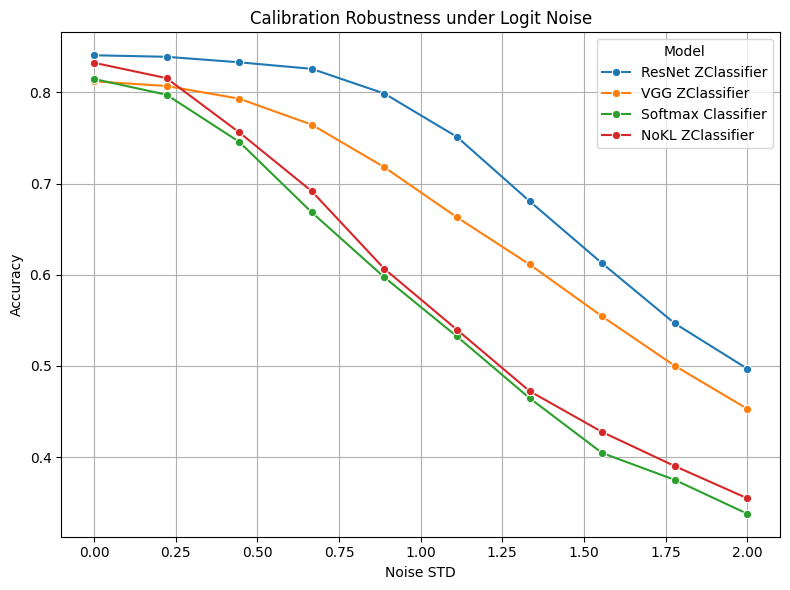

In [ ]:
plot_calibration_results(results_dict)

## 2. **Latent Logit Geometry Consistency**




Compare latent structure between backbones (e.g., ResNet vs VGG).

### PCA on train set
Most general linear dimensionality reduction.

In [ ]:
def visualize_latent_geometry(model, dataloader, name, num_batches=100):
    model.eval()
    all_latents, all_labels = [], []

    with torch.no_grad():
        for i, (images, labels) in enumerate(dataloader):
            if i >= num_batches: break
            images = images.to(device)
            z = model(images)
            z_flat = z.view(z.size(0), -1)
            all_latents.append(z_flat.cpu())
            all_labels.append(labels)

    X = torch.cat(all_latents, dim=0).numpy()
    y = torch.cat(all_labels, dim=0).numpy()

    X_pca = PCA(n_components=2).fit_transform(X)
    plt.figure(figsize=(10, 10))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=y, palette='tab10', legend='full')
    plt.title(f"PCA of {name} Latent Logit Space")
    plt.grid(True)
    plt.show()

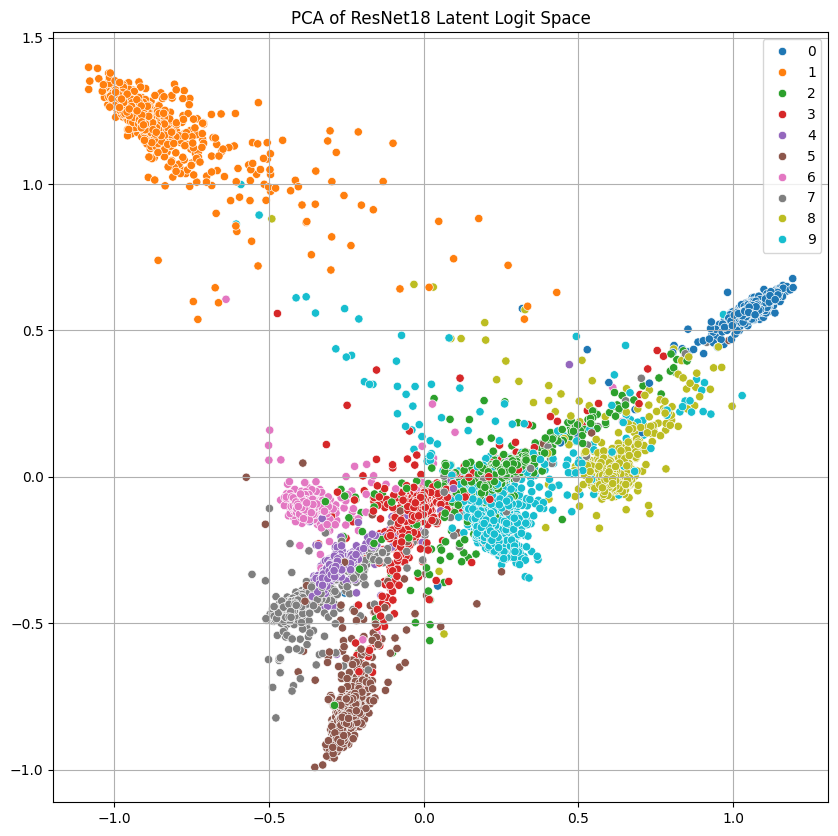

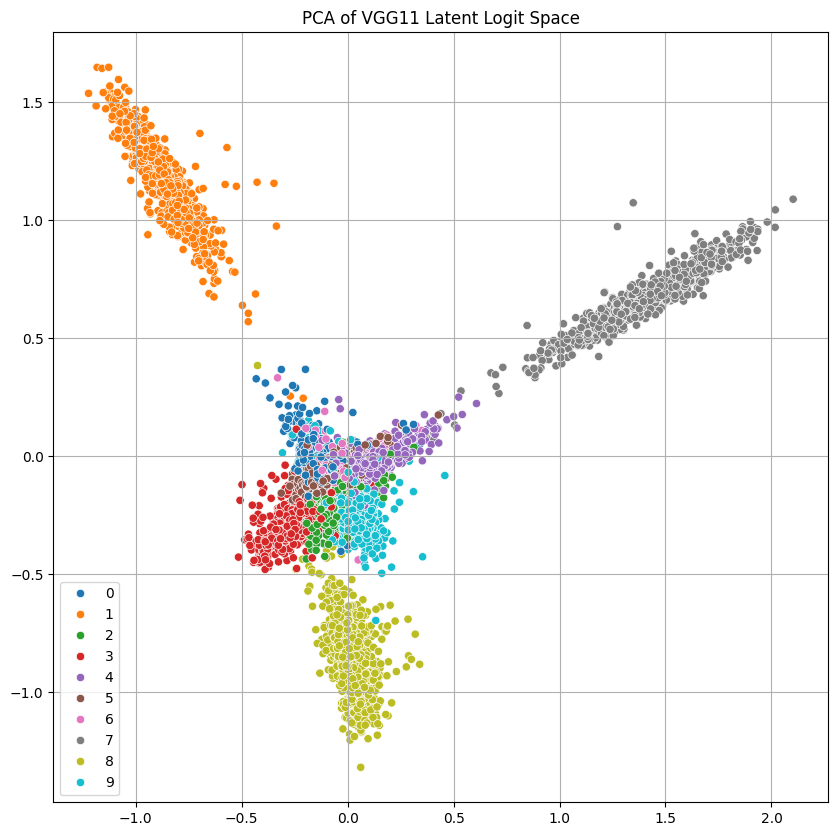

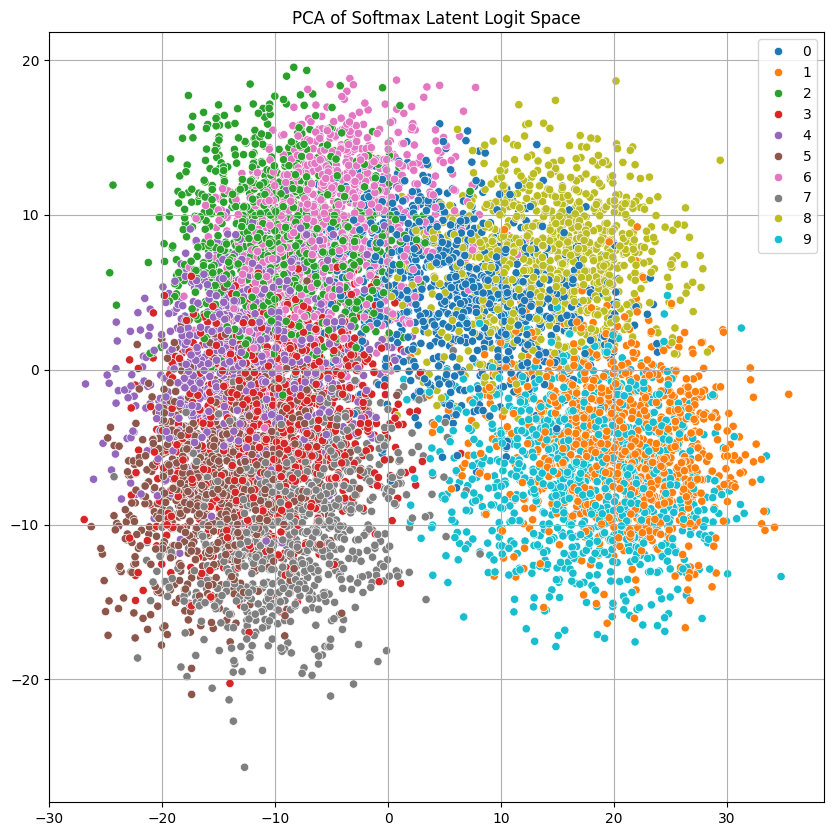

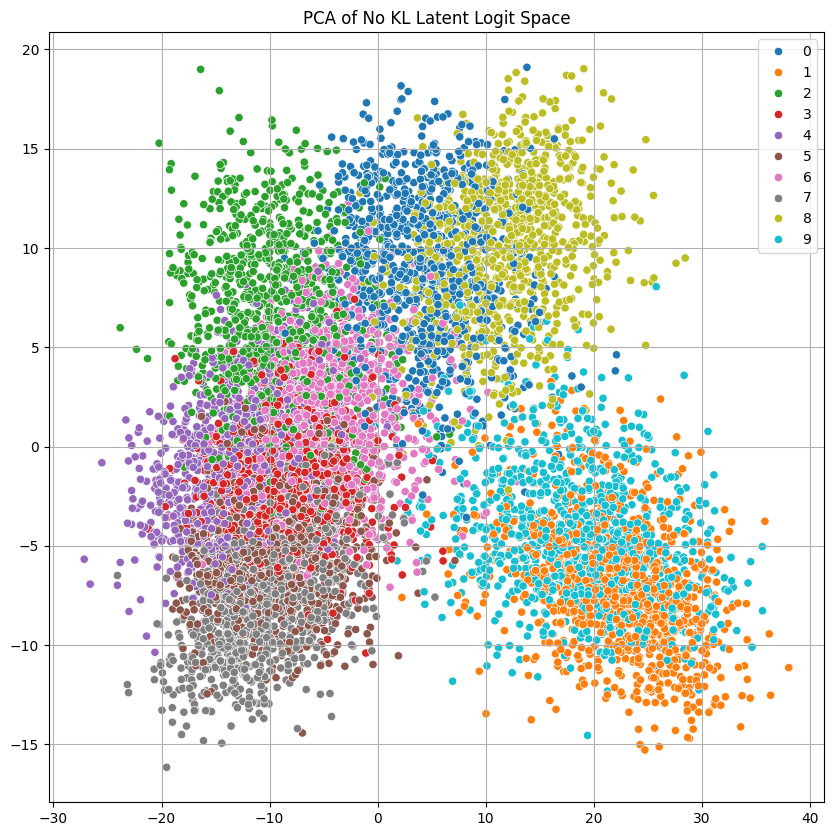

In [ ]:
visualize_latent_geometry(modelA, train_loader, name="ResNet18")
visualize_latent_geometry(modelB, train_loader, name="VGG11")
visualize_latent_geometry(softmax_model, train_loader, name="Softmax")
visualize_latent_geometry(nokl_model, train_loader, name="No KL")

### t-SNE

In [ ]:
def simulate_latents(model_type='resnet', n_samples=1000, batch_size=100, seed=42):

    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # 1. Data load
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Fit to VGG/ResNet input size
        transforms.ToTensor(),
    ])
    cifar10 = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    loader = DataLoader(cifar10, batch_size=batch_size, shuffle=False)

    # 2. Load pretrianed models
    if model_type == 'resnet':
        model = modelA
    elif model_type == 'vgg':
        model = modelB
    elif model_type == 'softmax':
        model = softmax_model
    elif model_type == 'nokl':
        model = nokl_model
    else:
        raise ValueError("model_type must be one of: ['resnet', 'vgg', 'softmax', 'nokl']")

    model.eval()

    # 3. Logits
    all_latents = []
    all_labels = []

    with torch.no_grad():
        for x, y in tqdm(loader, desc=f"Simulating {model_type}"):
            x = x.to(device)
            z = model(x).detach().cpu()

            all_latents.append(z)
            all_labels.append(y)

    all_latents = torch.cat(all_latents, dim=0).numpy()
    all_labels = torch.cat(all_labels, dim=0).numpy()
    return all_latents, all_labels


# 2. Simulate latent logit outputs
resnet_latents, resnet_labels = simulate_latents('resnet')
vgg_latents, vgg_labels = simulate_latents('vgg')
softmax_latents, softmax_labels = simulate_latents('softmax')
nokl_latents, nokl_labels = simulate_latents('nokl')

Simulating resnet:   0%|          | 0/100 [00:00<?, ?it/s]

Simulating vgg:   0%|          | 0/100 [00:00<?, ?it/s]

Simulating softmax:   0%|          | 0/100 [00:00<?, ?it/s]

Simulating nokl:   0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
def plot_tsne(features, labels, title="t-SNE Embedding"):
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, max_iter=1000, random_state=42)
    features_2d = tsne.fit_transform(features)

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap='tab10', s=10, alpha=0.6)
    plt.legend(*scatter.legend_elements(), title="Class")
    plt.title(title)
    plt.grid(True)
    plt.show()


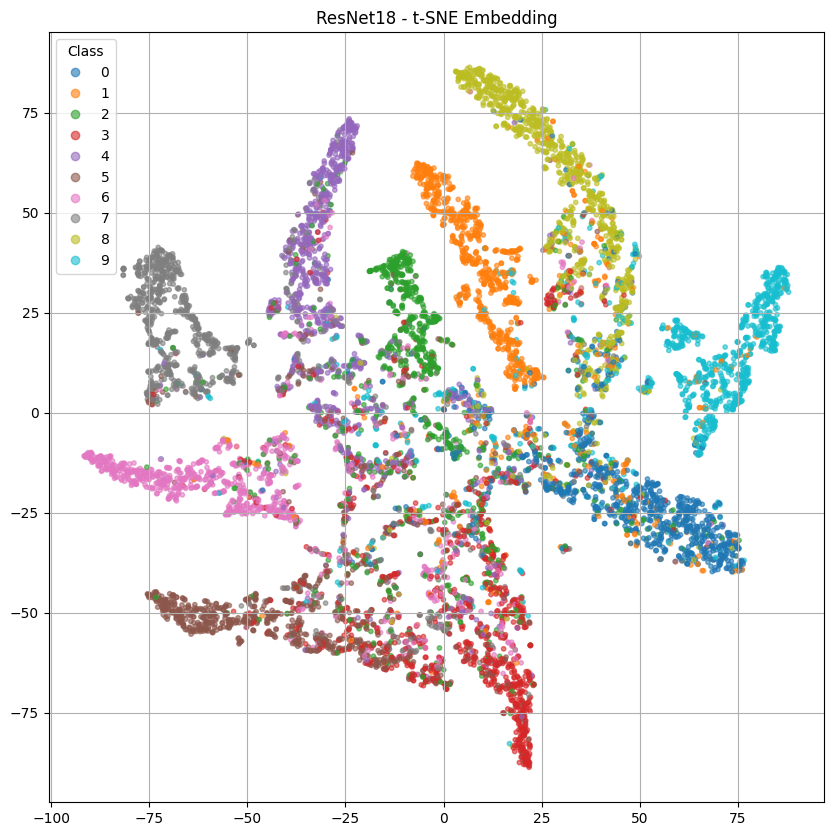

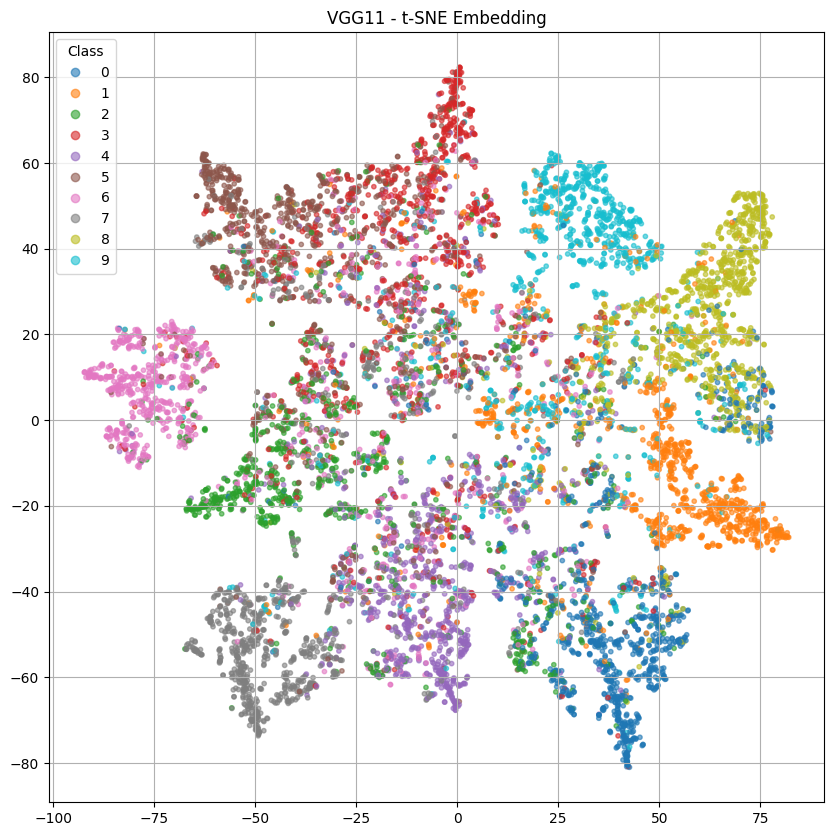

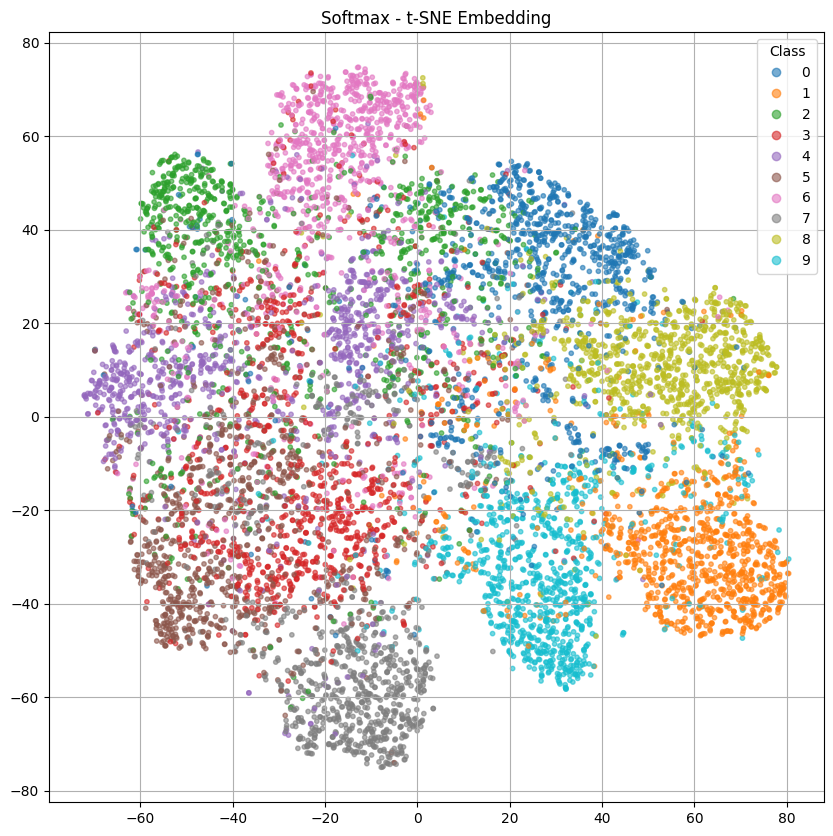

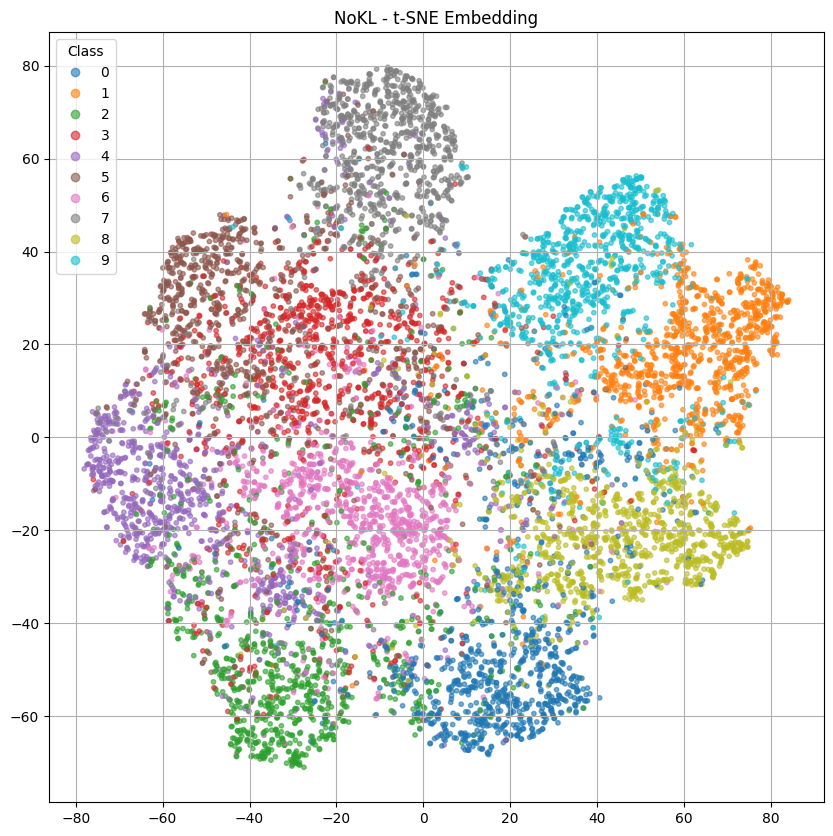

In [ ]:
# features: latent vector (e.g. model.z.mean(-1).detach().cpu().numpy())
# labels: ground-truth class labels
plot_tsne(resnet_latents, resnet_labels, title="ResNet18 - t-SNE Embedding")
plot_tsne(vgg_latents, vgg_labels, title="VGG11 - t-SNE Embedding")
plot_tsne(softmax_latents, softmax_labels, title="Softmax - t-SNE Embedding")
plot_tsne(nokl_latents, nokl_labels, title="NoKL - t-SNE Embedding")

### Fisher LDA

In [ ]:
def plot_fisher_lda(features, labels, title="Fisher LDA Embedding"):
    lda = LDA(n_components=2)
    features_2d = lda.fit_transform(features, labels)

    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap='tab10', s=10, alpha=0.6)
    plt.title(title)
    plt.legend(*scatter.legend_elements(), title="Class")
    plt.grid(True)
    plt.show()

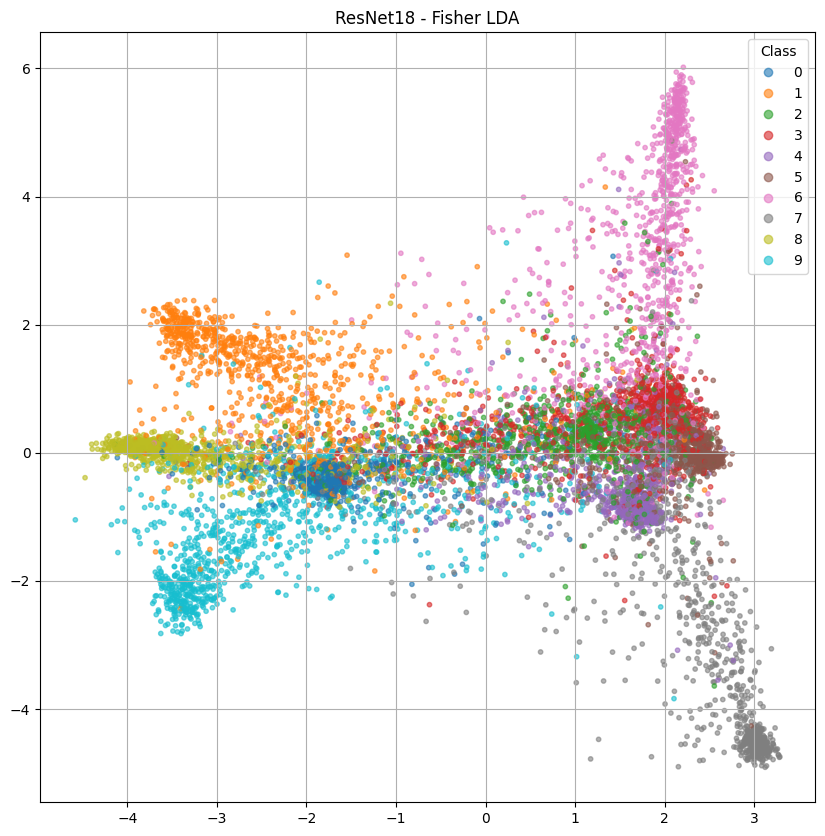

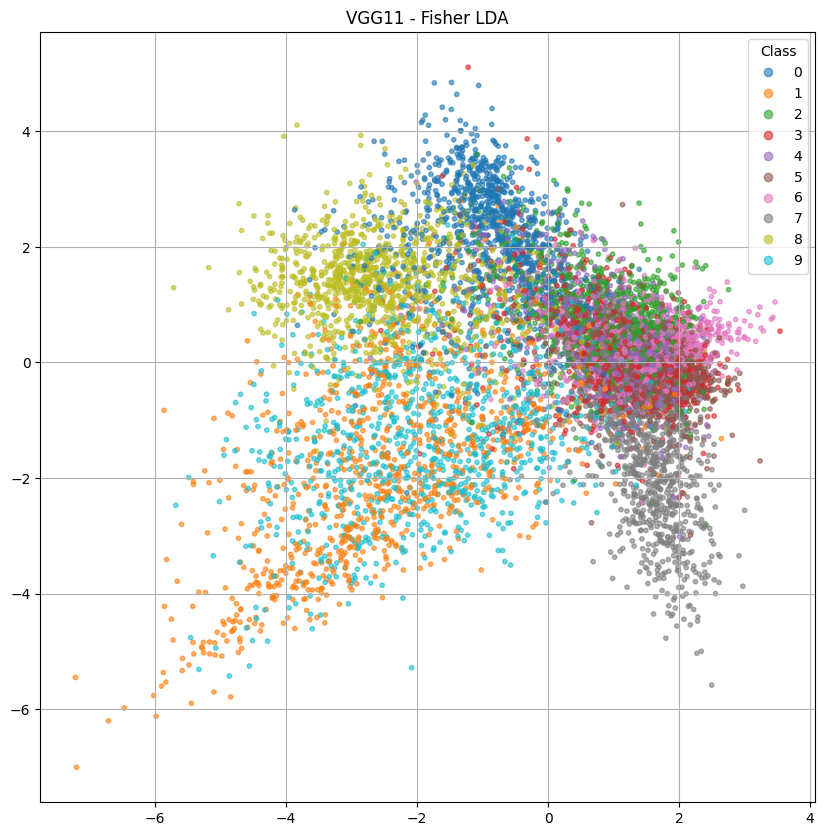

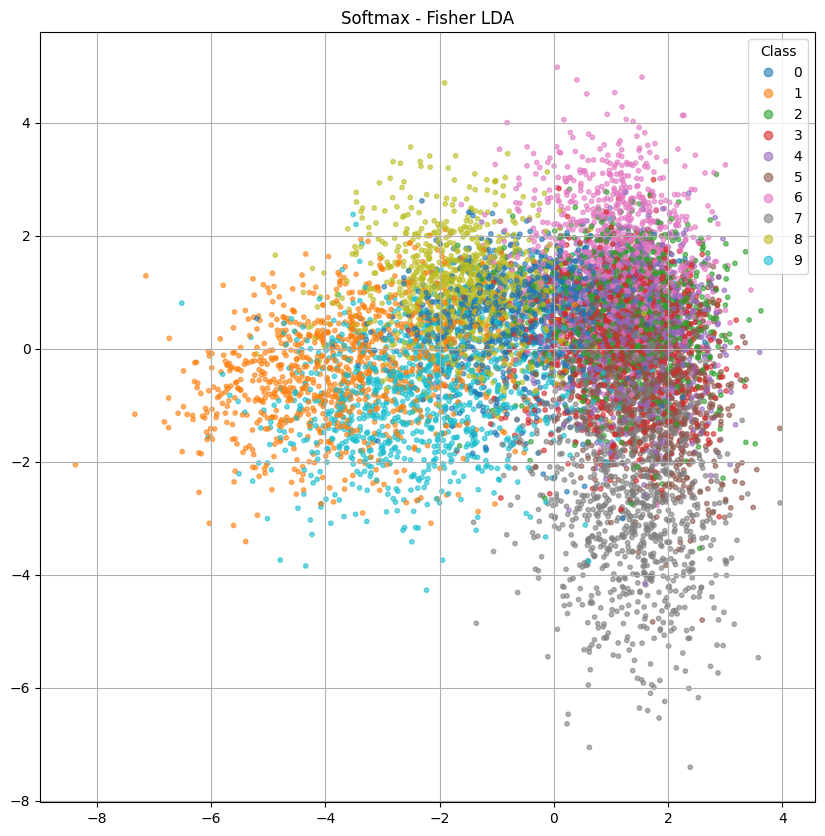

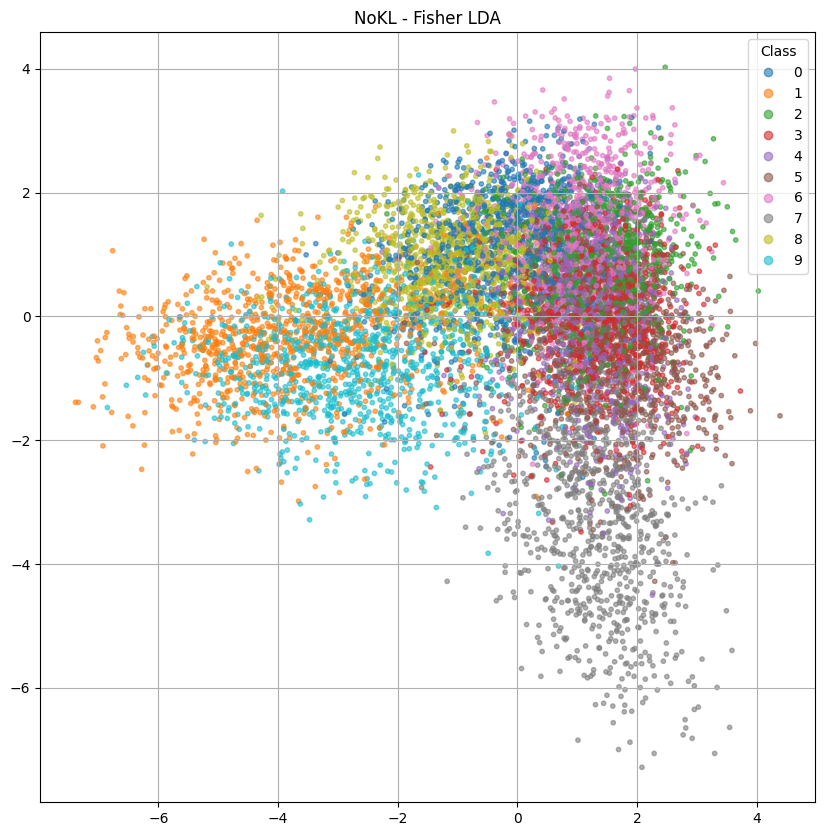

In [ ]:
plot_fisher_lda(resnet_latents, resnet_labels, title="ResNet18 - Fisher LDA")
plot_fisher_lda(vgg_latents, vgg_labels, title="VGG11 - Fisher LDA")
plot_fisher_lda(softmax_latents, softmax_labels, title="Softmax - Fisher LDA")
plot_fisher_lda(nokl_latents, nokl_labels, title="NoKL - Fisher LDA")

### PCA on validation set

In [ ]:
def plot_classwise_pca(latents, labels, model_name='Model'):
    pca = PCA(n_components=2)
    z2d = pca.fit_transform(latents)

    plt.figure(figsize=(10, 10))
    sns.scatterplot(x=z2d[:, 0], y=z2d[:, 1], hue=labels, palette='tab10', s=30, alpha=0.8)
    plt.title(f'PCA of Latent Logit Space ({model_name})')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.legend(title='Class')
    plt.grid(True)
    plt.show()


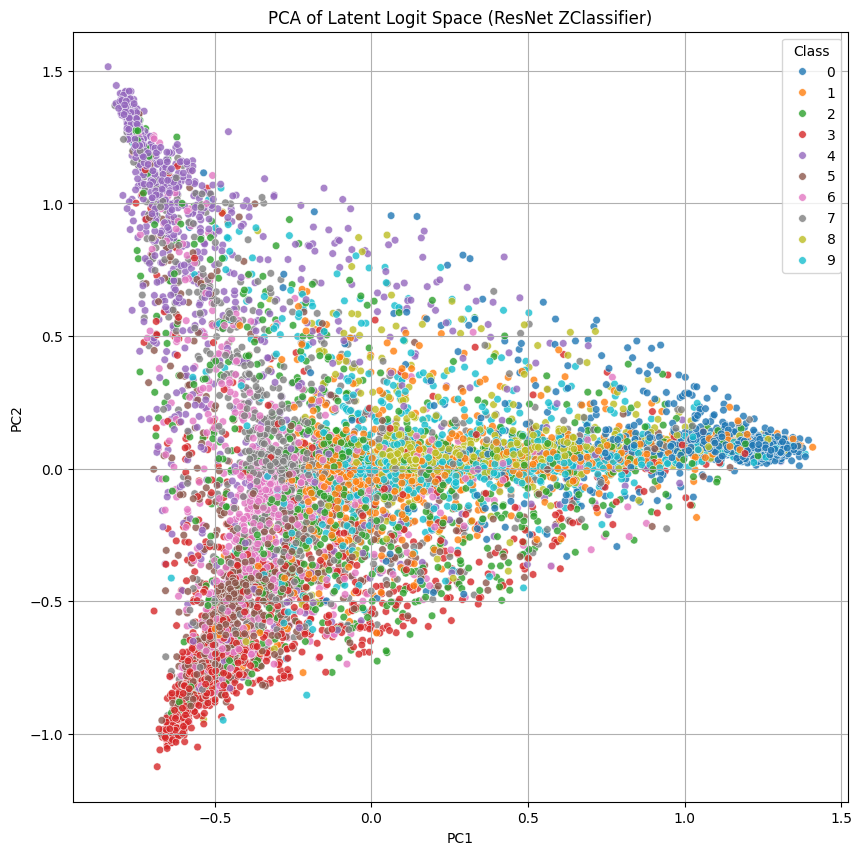

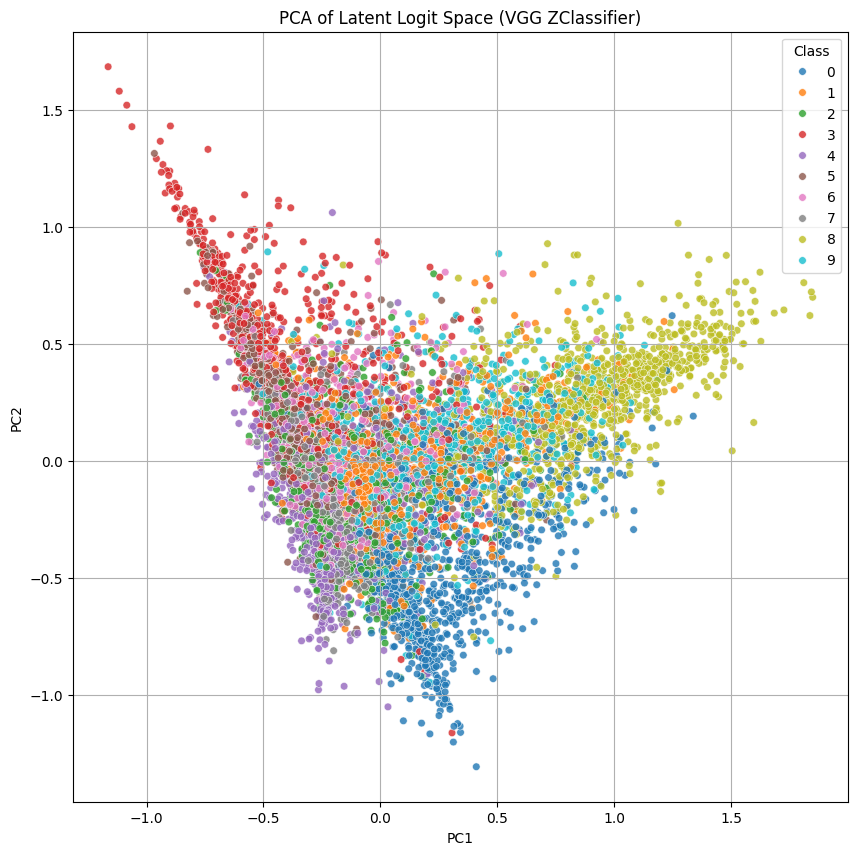

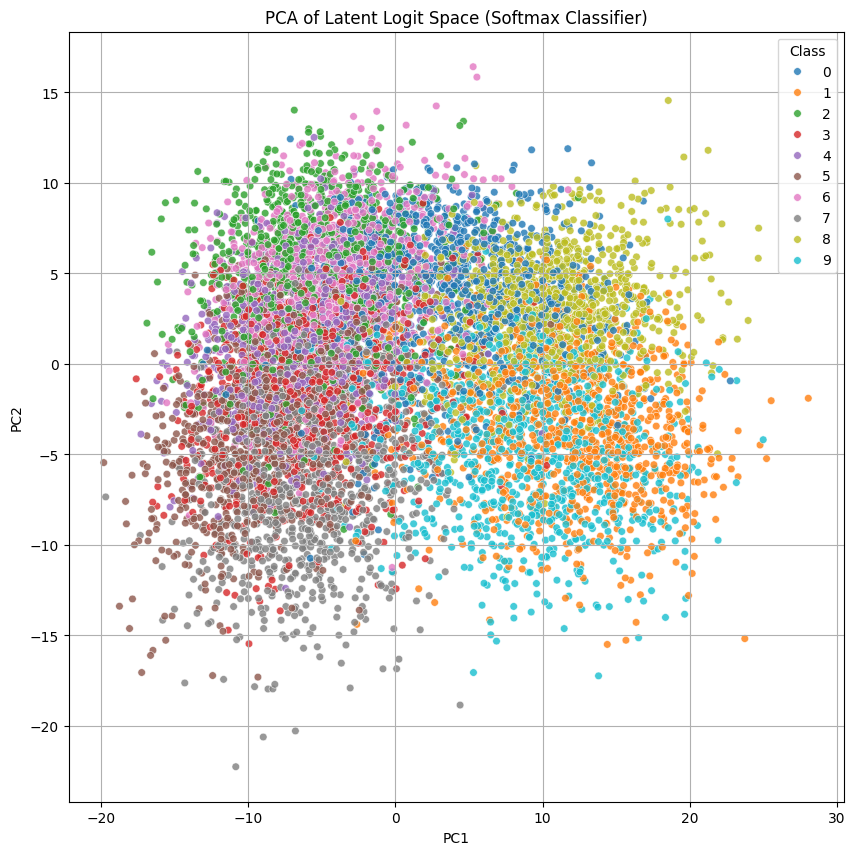

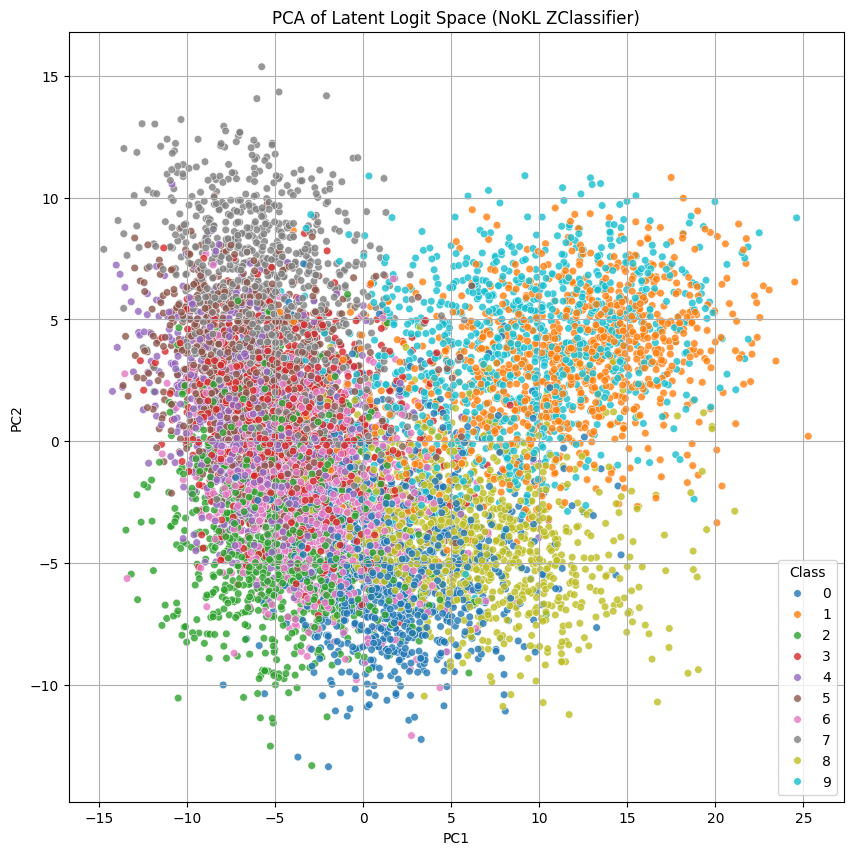

In [ ]:
plot_classwise_pca(resnet_latents, resnet_labels, model_name='ResNet ZClassifier')
plot_classwise_pca(vgg_latents, vgg_labels, model_name='VGG ZClassifier')
plot_classwise_pca(softmax_latents, softmax_labels, model_name='Softmax Classifier')
plot_classwise_pca(nokl_latents, nokl_labels, model_name='NoKL ZClassifier')

### GMM Ellipsis with PCA

In [ ]:
def plot_gmm_ellipses(z_all, labels_all, name, n_components=10):
    N, C = z_all.shape

    # 2D PCA
    z_2d = PCA(n_components=2).fit_transform(z_all)

    # GMM
    gmm = GaussianMixture(n_components=n_components, covariance_type='full')
    gmm.fit(z_2d)

    # Ellipsis
    sns.jointplot(x=z_2d[:, 0], y=z_2d[:, 1],
                  height=10,
                  s=5, hue=labels_all, alpha=0.6,
                  palette="coolwarm")

    for i in range(n_components):
        mean = gmm.means_[i]
        cov = gmm.covariances_[i]
        eigvals, eigvecs = np.linalg.eigh(cov)
        angle = np.degrees(np.arctan2(eigvecs[1, 0], eigvecs[0, 0]))
        width, height = 2 * np.sqrt(eigvals)

        ell = Ellipse(xy=mean, width=width, height=height, angle=angle, edgecolor='k', facecolor='none')
        plt.gca().add_patch(ell)

    plt.title(f"GMM Ellipses over {name} Logits (PCA 2D)")
    plt.xlabel("PC-1")
    plt.ylabel("PC-2")
    plt.legend(title='Class')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


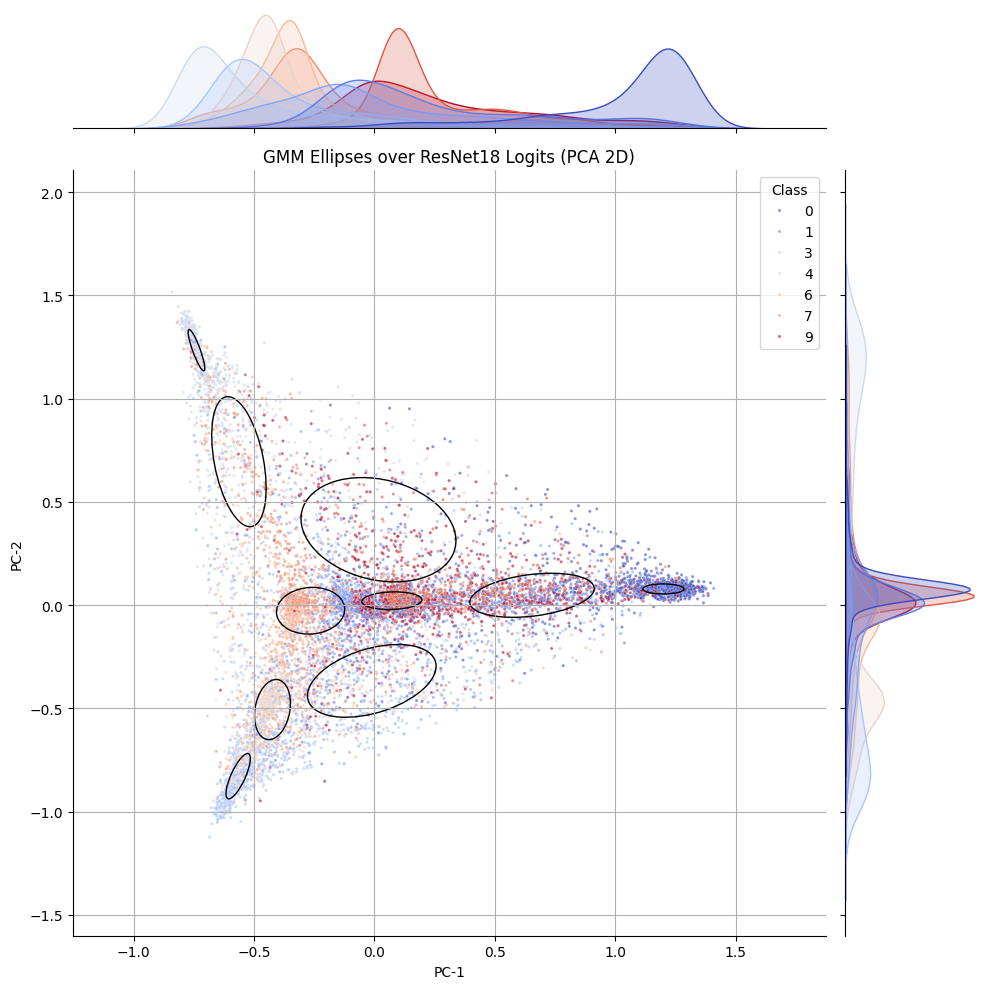

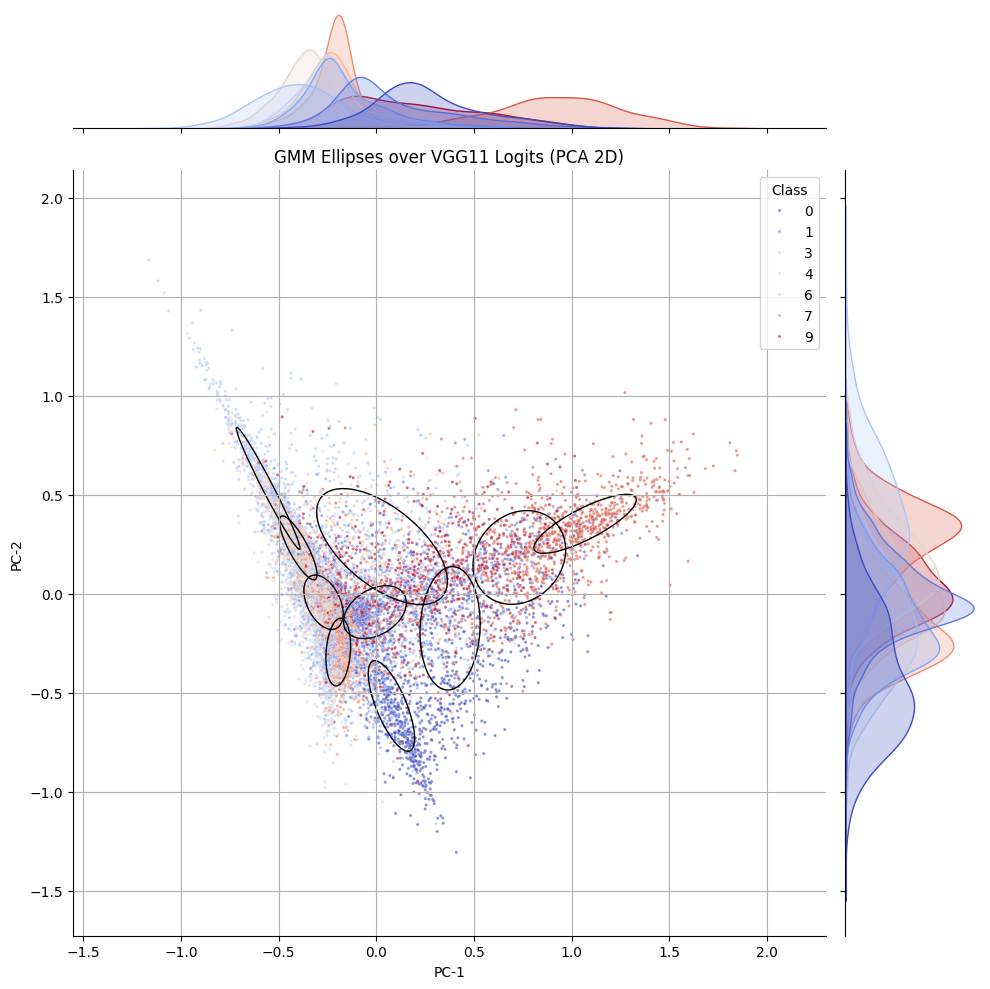

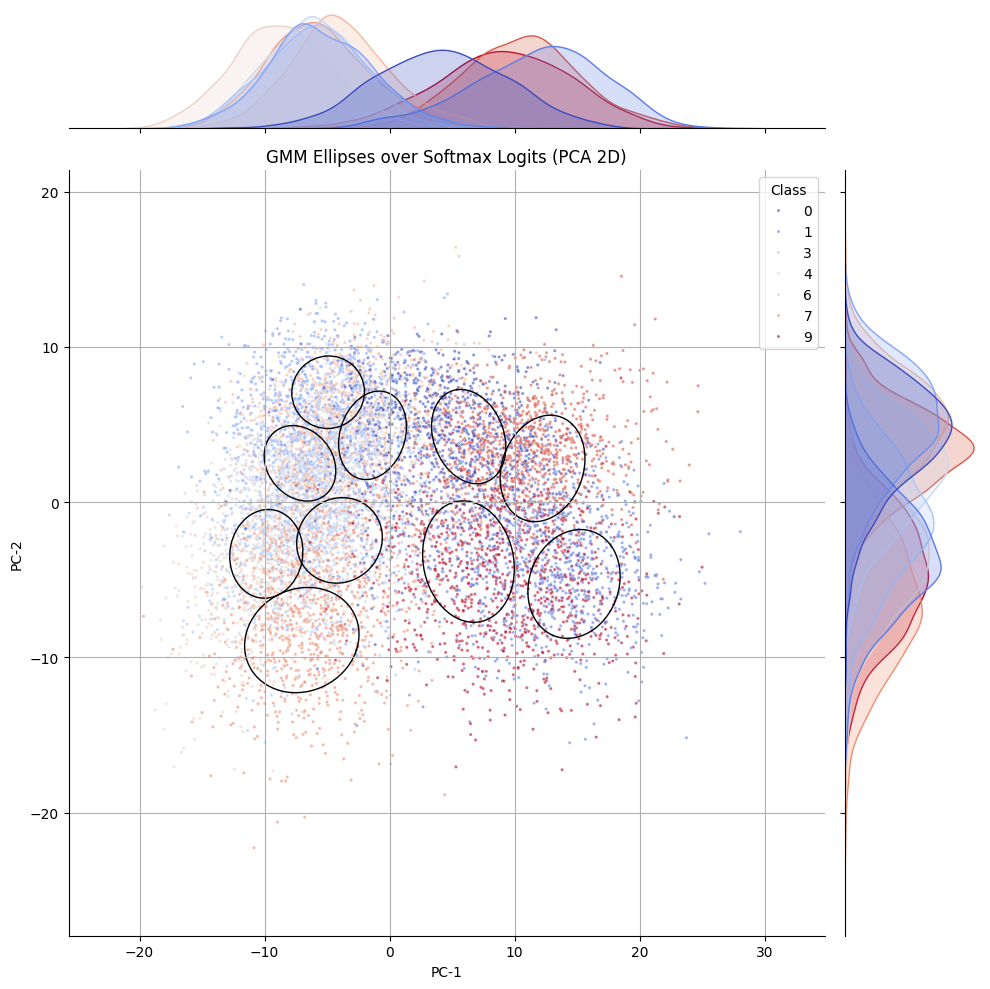

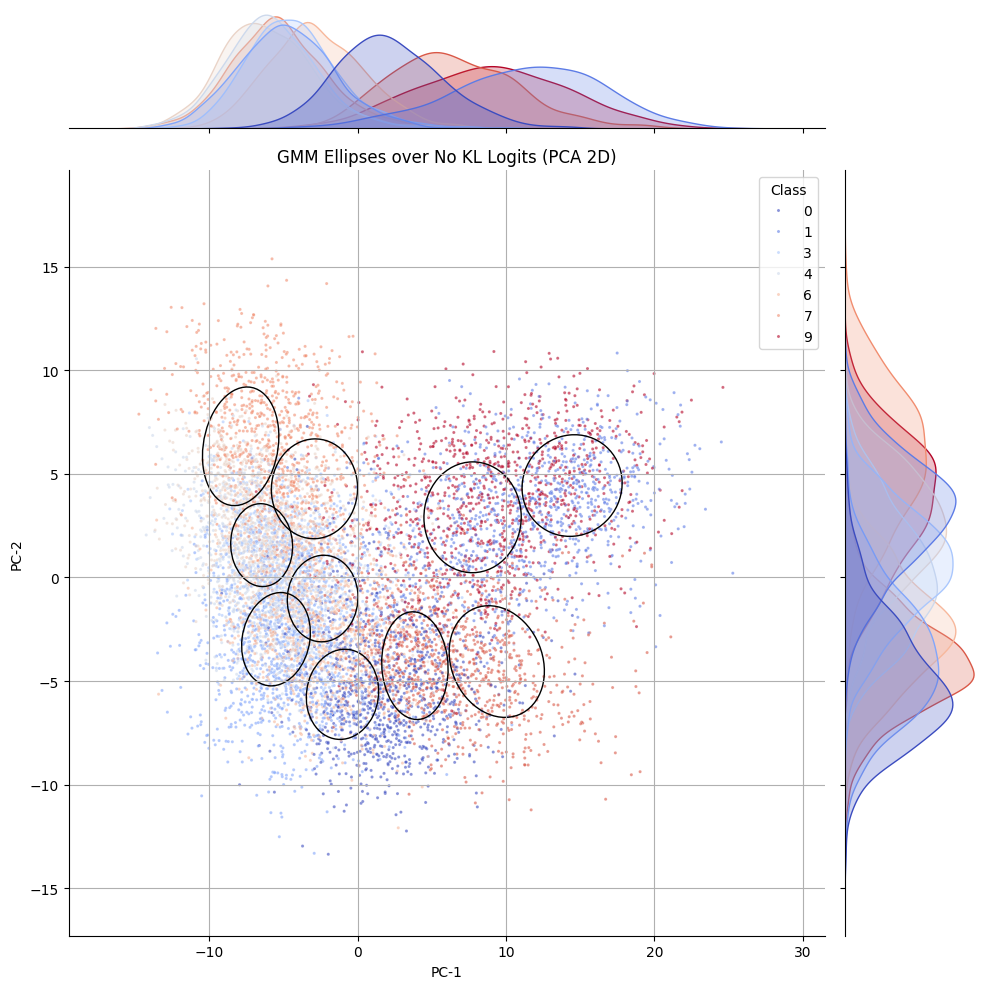

In [ ]:
plot_gmm_ellipses(resnet_latents, resnet_labels, name="ResNet18")
plot_gmm_ellipses(vgg_latents, vgg_labels, name="VGG11")
plot_gmm_ellipses(softmax_latents, softmax_labels, name="Softmax")
plot_gmm_ellipses(nokl_latents, nokl_labels, name="No KL")

## 3. **OOD Detection via KL Score**

Use the KL divergence to the closest one-hot Gaussian to detect OOD samples.
`SoftmaxClassifier` doesn't outputs distributions or random vectors, so it is out of the evalutaions.

In [14]:
def compute_kl_scores(mu, logvar):
    """
    KL divergence between N(mu, sigma^2) and N(0,1)
    """
    var = logvar.exp()
    std_normal = Normal(torch.zeros_like(mu), torch.ones_like(var))
    pred_normal = Normal(mu, var.sqrt())
    kl = kl_divergence(pred_normal, std_normal)  # shape: [batch, classes]
    return kl.mean(dim=1)  # [batch]

def evaluate_ood_score(in_scores, ood_scores):
    labels = np.array([1] * len(in_scores) + [0] * len(ood_scores))  # 1: In, 0: OOD
    scores = np.concatenate([in_scores, ood_scores])

    auroc = roc_auc_score(labels, -scores)
    aupr = average_precision_score(labels, -scores)

    fpr, tpr, _ = roc_curve(labels, -scores)
    fpr95 = fpr[np.argmax(tpr >= 0.95)]

    return {'AUROC': auroc, 'AUPR': aupr, 'FPR@95': fpr95}, labels, scores

def evaluate_ood_detection(model, in_loader, ood_loader, device=device):
    model.eval()
    in_scores, ood_scores = [], []

    with torch.no_grad():
        for images, _ in in_loader:
            images = images.to(device)
            _ = model(images)
            mu, logvar = model.mu.clone(), model.logvar.clone()
            kl = compute_kl_scores(mu, logvar)
            in_scores.extend(kl.cpu().numpy())

        for images, _ in ood_loader:
            images = images.to(device)
            _ = model(images)
            mu, logvar = model.mu.clone(), model.logvar.clone()
            kl = compute_kl_scores(mu, logvar)
            ood_scores.extend(kl.cpu().numpy())

    # metrics
    metrics, labels, scores = evaluate_ood_score(in_scores, ood_scores)

    in_scores = np.array(in_scores)
    ood_scores = np.array(ood_scores)

    # report
    threshold = np.percentile(-in_scores, 5)  # conservative thresholding (5% percentile)
    predicted = (-np.array(scores) > threshold).astype(int)
    report = classification_report(labels, predicted, target_names=['OOD', 'In-Distribution'])

    print("📊 OOD Detection Performance:")
    for k, v in metrics.items():
        print(f"{k}: {v:.4f}")

    print("\n📋 Classification Report (Threshold = {:.4f}):".format(threshold))
    print(report)

    # visualize
    plt.hist(in_scores, bins=50, density=True, alpha=0.5, label="In-Distribution")
    plt.hist(ood_scores, bins=50, density=True, alpha=0.5, label="Out-of-Distribution")
    plt.title("KL Divergence Scores for OOD Detection")
    plt.xlabel("KL Score")
    plt.ylabel("Count")
    plt.legend()
    plt.show()

    return metrics

In [15]:
from torchvision.datasets import SVHN
from torchvision.datasets import CIFAR100

class SyntheticNoiseDataset(torch.utils.data.Dataset):
    def __init__(self, kind='gaussian', size=10000, image_shape=(3, 32, 32)):
        self.kind = kind
        self.size = size
        self.image_shape = image_shape

    def __getitem__(self, idx):
        if self.kind == 'gaussian':
            img = torch.randn(self.image_shape)
        elif self.kind == 'uniform':
            img = torch.rand(self.image_shape)
        else:
            raise ValueError("Unsupported noise type.")
        return img, 0  # dummy label

    def __len__(self):
        return self.size

def get_noise_loader(kind='gaussian', batch_size=100):
    dataset = SyntheticNoiseDataset(kind=kind)
    return DataLoader(dataset, batch_size=batch_size, shuffle=False)

def get_svhn_loader(batch_size=100):
    transform = transforms.Compose([transforms.Resize((32, 32)), transforms.ToTensor()])
    svhn = SVHN(root='./data', split='test', download=True, transform=transform)
    return DataLoader(svhn, batch_size=batch_size, shuffle=False)

def get_cifar100_loader(batch_size=100):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.4914, 0.4822, 0.4465],
                             std=[0.2023, 0.1994, 0.2010])
    ])
    cifar100 = CIFAR100(root='./data', train=False, download=True, transform=transform)
    return DataLoader(cifar100, batch_size=batch_size, shuffle=False)

In [17]:
ood_svhn = get_svhn_loader()
ood_gaussian = get_noise_loader('gaussian')
ood_uniform = get_noise_loader('uniform')
ood_cifar100 = get_cifar100_loader()

100%|██████████| 169M/169M [00:10<00:00, 15.9MB/s]


📊 OOD Detection Performance:
AUROC: 0.9994
AUPR: 0.9994
FPR@95: 0.0000

📋 Classification Report (Threshold = -2.5809):
                 precision    recall  f1-score   support

            OOD       0.98      1.00      0.99     26032
In-Distribution       1.00      0.95      0.97     10000

       accuracy                           0.99     36032
      macro avg       0.99      0.97      0.98     36032
   weighted avg       0.99      0.99      0.99     36032



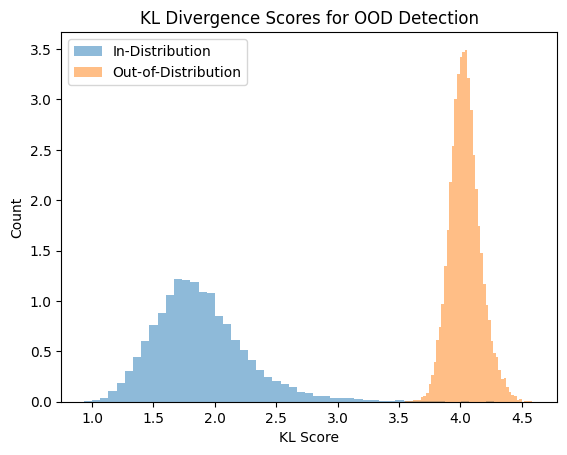

📊 OOD Detection Performance:
AUROC: 0.8333
AUPR: 0.5573
FPR@95: 0.4114

📋 Classification Report (Threshold = -2.6461):
                 precision    recall  f1-score   support

            OOD       0.97      0.59      0.73     26032
In-Distribution       0.47      0.95      0.63     10000

       accuracy                           0.69     36032
      macro avg       0.72      0.77      0.68     36032
   weighted avg       0.83      0.69      0.70     36032



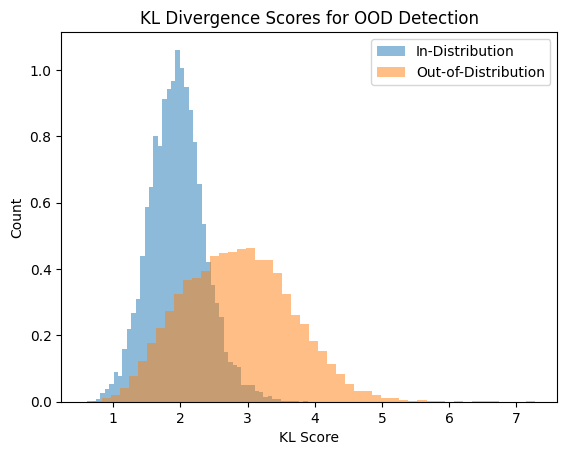

📊 OOD Detection Performance:
AUROC: 0.0122
AUPR: 0.1540
FPR@95: 1.0000

📋 Classification Report (Threshold = -48.1674):
                 precision    recall  f1-score   support

            OOD       0.00      0.00      0.00     26032
In-Distribution       0.27      0.95      0.42     10000

       accuracy                           0.26     36032
      macro avg       0.13      0.47      0.21     36032
   weighted avg       0.07      0.26      0.12     36032



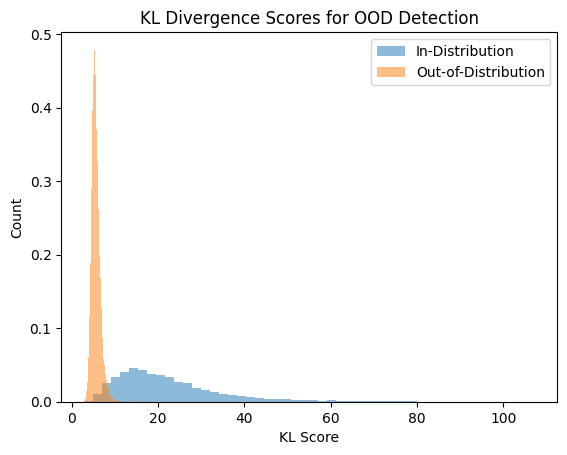

{'AUROC': np.float64(0.012166641057160418),
 'AUPR': np.float64(0.15398987506434136),
 'FPR@95': np.float64(1.0)}

In [ ]:
evaluate_ood_detection(modelA, eval_loader, ood_svhn)
evaluate_ood_detection(modelB, eval_loader, ood_svhn)
evaluate_ood_detection(nokl_model, eval_loader, ood_svhn)

📊 OOD Detection Performance:
AUROC: 0.9997
AUPR: 0.9998
FPR@95: 0.0000

📋 Classification Report (Threshold = -2.5809):
                 precision    recall  f1-score   support

            OOD       0.95      1.00      0.98     10000
In-Distribution       1.00      0.95      0.97     10000

       accuracy                           0.97     20000
      macro avg       0.98      0.97      0.97     20000
   weighted avg       0.98      0.97      0.97     20000



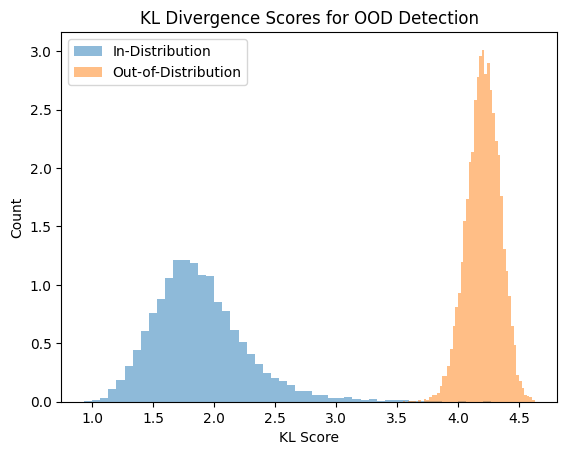

📊 OOD Detection Performance:
AUROC: 0.9528
AUPR: 0.9511
FPR@95: 0.2152

📋 Classification Report (Threshold = -2.6461):
                 precision    recall  f1-score   support

            OOD       0.94      0.78      0.86     10000
In-Distribution       0.82      0.95      0.88     10000

       accuracy                           0.87     20000
      macro avg       0.88      0.87      0.87     20000
   weighted avg       0.88      0.87      0.87     20000



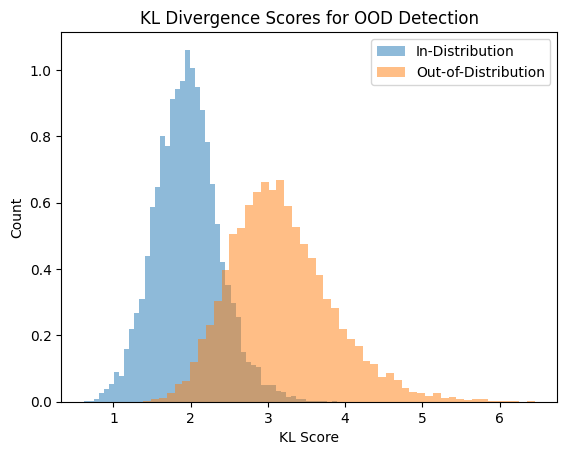

📊 OOD Detection Performance:
AUROC: 0.0208
AUPR: 0.3076
FPR@95: 1.0000

📋 Classification Report (Threshold = -48.1674):
                 precision    recall  f1-score   support

            OOD       0.00      0.00      0.00     10000
In-Distribution       0.49      0.95      0.64     10000

       accuracy                           0.47     20000
      macro avg       0.24      0.47      0.32     20000
   weighted avg       0.24      0.47      0.32     20000



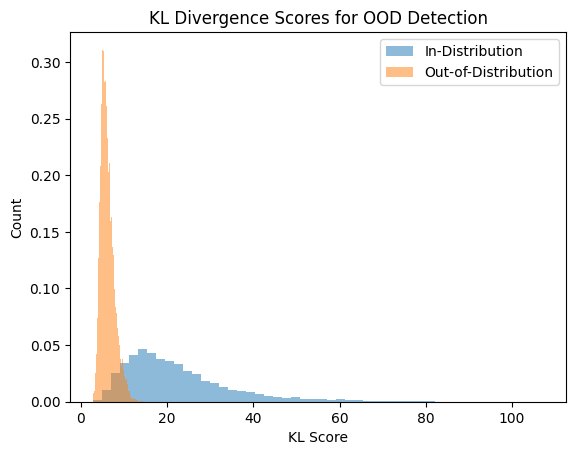

{'AUROC': np.float64(0.020798445),
 'AUPR': np.float64(0.30761905229416864),
 'FPR@95': np.float64(1.0)}

In [ ]:
evaluate_ood_detection(modelA, eval_loader, ood_gaussian)
evaluate_ood_detection(modelB, eval_loader, ood_gaussian)
evaluate_ood_detection(nokl_model, eval_loader, ood_gaussian)

📊 OOD Detection Performance:
AUROC: 0.9992
AUPR: 0.9996
FPR@95: 0.0000

📋 Classification Report (Threshold = -2.5809):
                 precision    recall  f1-score   support

            OOD       0.95      1.00      0.98     10000
In-Distribution       1.00      0.95      0.97     10000

       accuracy                           0.97     20000
      macro avg       0.98      0.97      0.97     20000
   weighted avg       0.98      0.97      0.97     20000



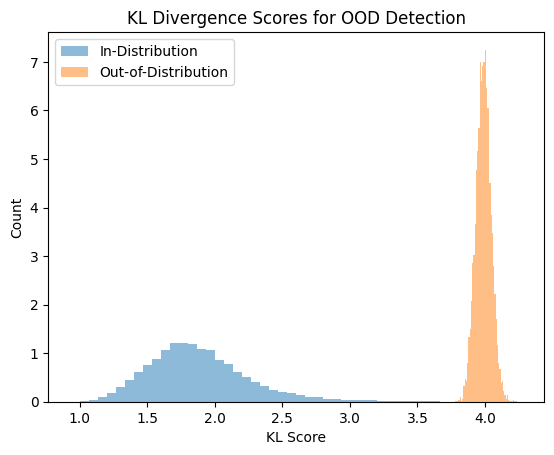

📊 OOD Detection Performance:
AUROC: 0.9298
AUPR: 0.9455
FPR@95: 0.4424

📋 Classification Report (Threshold = -2.6461):
                 precision    recall  f1-score   support

            OOD       0.92      0.56      0.69     10000
In-Distribution       0.68      0.95      0.79     10000

       accuracy                           0.75     20000
      macro avg       0.80      0.75      0.74     20000
   weighted avg       0.80      0.75      0.74     20000



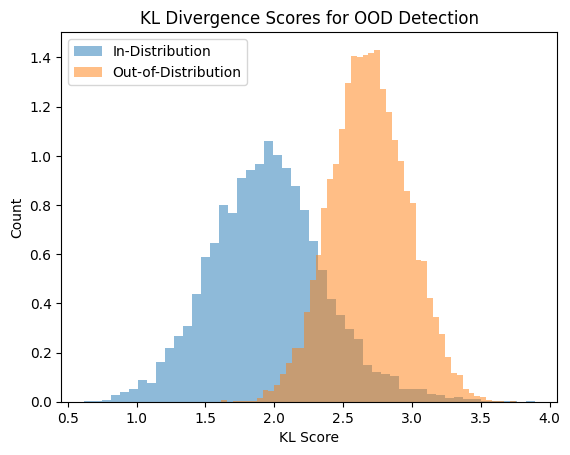

📊 OOD Detection Performance:
AUROC: 0.0184
AUPR: 0.3093
FPR@95: 1.0000

📋 Classification Report (Threshold = -48.1674):
                 precision    recall  f1-score   support

            OOD       0.00      0.00      0.00     10000
In-Distribution       0.49      0.95      0.64     10000

       accuracy                           0.47     20000
      macro avg       0.24      0.47      0.32     20000
   weighted avg       0.24      0.47      0.32     20000



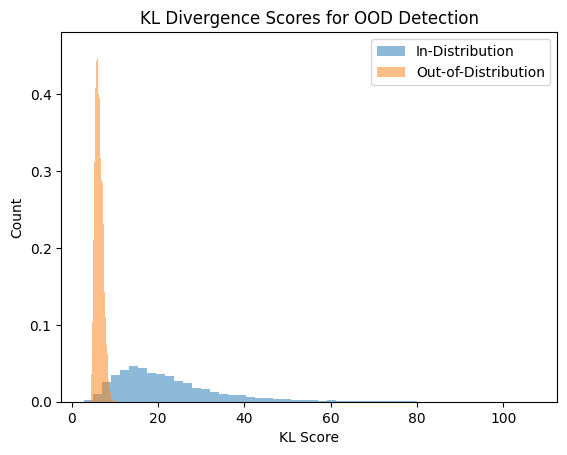

{'AUROC': np.float64(0.018354405),
 'AUPR': np.float64(0.30927731103383604),
 'FPR@95': np.float64(1.0)}

In [ ]:
evaluate_ood_detection(modelA, eval_loader, ood_uniform)
evaluate_ood_detection(modelB, eval_loader, ood_uniform)
evaluate_ood_detection(nokl_model, eval_loader, ood_uniform)

📊 OOD Detection Performance:
AUROC: 0.9975
AUPR: 0.9983
FPR@95: 0.0000

📋 Classification Report (Threshold = -2.5809):
                 precision    recall  f1-score   support

            OOD       0.95      1.00      0.98     10000
In-Distribution       1.00      0.95      0.97     10000

       accuracy                           0.97     20000
      macro avg       0.98      0.97      0.97     20000
   weighted avg       0.98      0.97      0.97     20000



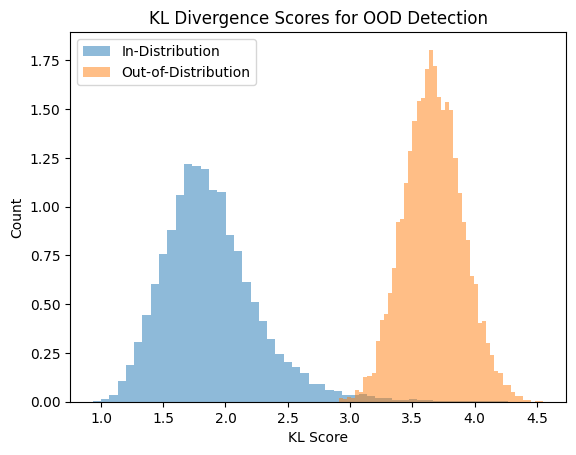

📊 OOD Detection Performance:
AUROC: 0.9995
AUPR: 0.9993
FPR@95: 0.0016

📋 Classification Report (Threshold = -2.6461):
                 precision    recall  f1-score   support

            OOD       0.95      1.00      0.97     10000
In-Distribution       1.00      0.95      0.97     10000

       accuracy                           0.97     20000
      macro avg       0.98      0.97      0.97     20000
   weighted avg       0.98      0.97      0.97     20000



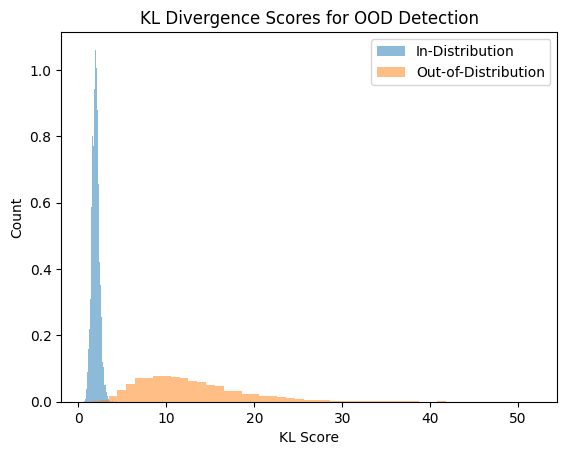

📊 OOD Detection Performance:
AUROC: 0.2349
AUPR: 0.3584
FPR@95: 1.0000

📋 Classification Report (Threshold = -48.1674):
                 precision    recall  f1-score   support

            OOD       0.00      0.00      0.00     10000
In-Distribution       0.49      0.95      0.64     10000

       accuracy                           0.47     20000
      macro avg       0.24      0.47      0.32     20000
   weighted avg       0.24      0.47      0.32     20000



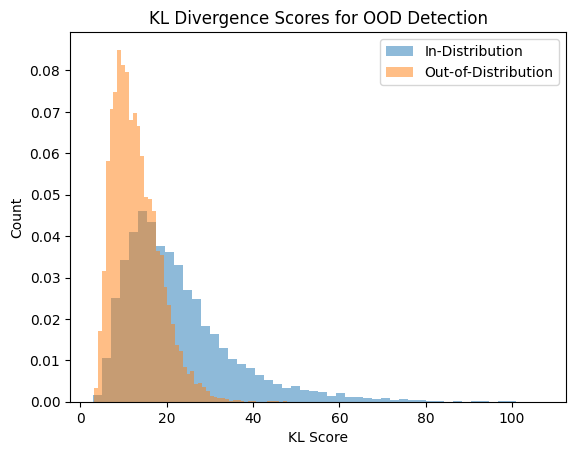

{'AUROC': np.float64(0.23494728),
 'AUPR': np.float64(0.35840326041366855),
 'FPR@95': np.float64(1.0)}

In [18]:
evaluate_ood_detection(modelA, eval_loader, ood_cifar100)
evaluate_ood_detection(modelB, eval_loader, ood_cifar100)
evaluate_ood_detection(nokl_model, eval_loader, ood_cifar100)